<div style="text-align:center;"><h1> Analyze the short channel data collected from Spectrapro+EMDCCD </h1></div>

Below is <span style="color:red">the process structure</span> of this jupyter notebook.  
The data you get containing three informations such as time, wavelength and intensity, represented as: $ I(t,\lambda) $

**Note that when you do *in-vivo* experiment, if you use <span style="color:red">binning</span>, no need to do extra moving average on spectrum. Like this example notebook.**  
**However, if you <span style="color:red">don't</span> use <span style="color:red">binning</span>, you need to adjust the <span style="color:red">moving average</span> on spectrum decreaing the noise on the spectrum**
- Format Setting

- Process Spectrapro+EMCCD raw data (image to csv file) <span style="color:red">(on image mode)</span>
    * Get Background Data
            $$ \bar{I}_{bg}(\lambda) = \frac{\sum_{t=0}^{N} I_{bg}(t,\lambda)}{N} $$
    * Subtract background
            $$ \hat{I}(t, \lambda) = I_{NoSpike}(t,\lambda) - \bar{I}_{bg}(\lambda)$$

- Sync Spectrapro image data to QEpro format csv file (time*wavelength)

- Initialize Processer Instance

- Analyze *in-vivo* Data
    * Process Raw *in-vivo* Data
        * Load <span style="color:red">sync</span> *in-vivo* data 
        * Remove spike
        * EMD
        * Get diastolic and systolic peaks
        * Plot Raw Data
        * Plot all results

- Analyze Phantom Data for Calibration
    * Process spectrapro+EMCCD raw phantom data
        * Sync spectraprofile to QEpro file
    * Load <span style="color:red">sync</span> measured phantom data  
    * Load simulated phantom data
    * fit measured phantom and simulated phantom
    * Save fitting result as csv file
    * Plot all measured phantom together

In [1]:
import numpy as np
import pandas as pd
from PyEMD import EMD 
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib
from utils import process_raw_data, process_phantom
from glob import glob
from tqdm import tqdm
import matplotlib.ticker as mtick
import json
from scipy.interpolate import interp1d
from natsort import natsorted 
# Default settings
mpl.rcParams.update(mpl.rcParamsDefault)
plt.style.use("seaborn-darkgrid")

C:\Users\dicky1031\AppData\Local\Temp\ipykernel_15812\3514809.py:17: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-darkgrid")


## Format Setting

In [11]:
subject_name = 'KB'
exp = 'VM'
date = '20230912'
pname = ['VM']

time_resolution = 0.10404 # [sec] # 0.10404, 0.10129
using_SDS = 10 # [mm]
phantom_measured_ID = ['22', '33', '44', '55']
phantom_simulated_ID = ['2', '3', '4', '5']
SDS_idx = 3  # SDS=10 mm, phantom simulated idx

## exp setting
baseline_start = 0 # [sec]
baseline_end = 60 # [sec]
exp_start = 60 # [sec]
exp_end = 75 # [sec]
recovery_start = 75 # [sec]
recovery_end = 670 # [sec] 

# setting
moving_window = 3 # [nm]
time_interval = 30 # [sec]

## EMCCD setting 
ifolder = os.path.join('dataset', subject_name, 'SDS1', f'{date}')
# used short channel
used_ch = 'ch3'
SDS_LIST = [4.5, 7.5, 10.5]
ofolder = os.path.join('dataset', subject_name, 'SDS1', f'm_out_{date}_{exp}')
os.makedirs(ofolder, exist_ok=True)

# Wavelength calibration factor defined : y = ax + b
a = 3.0375
b = 331.88

# Choose wavelength
start_wl = 119
stop_wl = 183

# Choose fiber output range
row_choose = ((2, 5), (6, 9), (11, 14))

mother_folder_name = os.path.join(subject_name, "SDS1", date, exp)
background_filenpath = os.path.join("dataset", subject_name, "SDS1", date,'background.csv')
data_filepath = os.path.join(ofolder, f'{subject_name}_SDS1_sync.csv')

## Process Spectrapro+EMCCD raw data (image to csv file)

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:51<00:00, 51.59s/it]


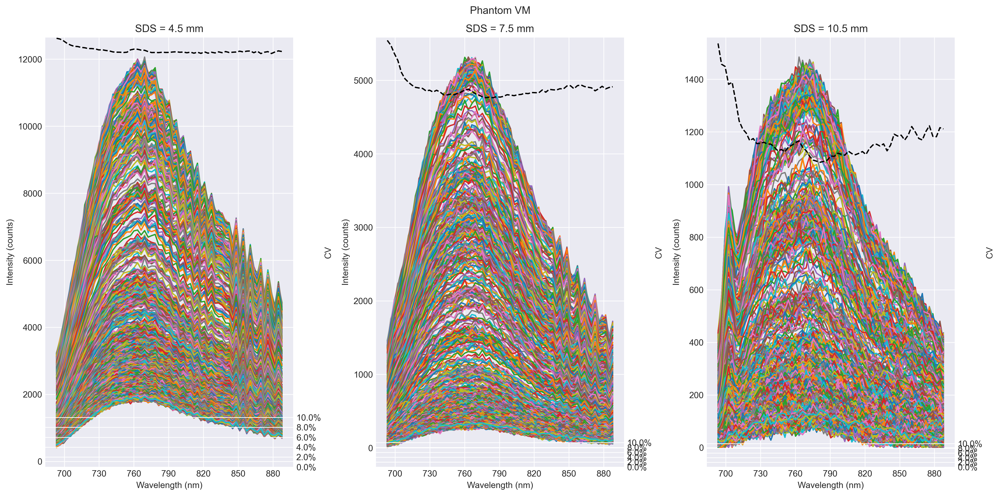

In [3]:
# %% Load target spectrum
folder_list = glob(os.path.join(ifolder, '*'))
stdname = 'standard0.1'
if any(stdname in folder_list[i] for i in range(len(folder_list))):
    path_det_bg = glob(os.path.join(ifolder, stdname, 'background*'))
    path_det_bg = natsorted(path_det_bg)
    
    path_det = glob(os.path.join(ifolder, stdname, 'std*')) 
    path_det = natsorted(path_det)
    
    bg_arr, df_det_mean, df_det_ch1, df_det_ch2, df_det_ch3 = process_raw_data.get_spec(path_det_bg, path_det, row_choose, a, b, img_size=(20, 320))
    df_det_mean.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_mean.csv'), index = False)
    df_det_ch1.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch1.csv'), index = False)
    df_det_ch2.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch2.csv'), index = False)
    df_det_ch3.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch3.csv'), index = False)
    
for tar_name in tqdm(pname):
    path_det_bg = glob(os.path.join(ifolder, tar_name, 'background*'))
    path_det_bg = natsorted(path_det_bg)
    
    path_det = glob(os.path.join(ifolder, tar_name, subject_name + '*')) 
    path_det = natsorted(path_det)
    
    bg_arr, df_det_mean, df_det_ch1, df_det_ch2, df_det_ch3 = process_raw_data.get_spec(path_det_bg, path_det, row_choose, a, b, img_size=(20, 320))
    df_det_mean.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_mean.csv'), index = False)
    df_det_ch1.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch1.csv'), index = False)
    df_det_ch2.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch2.csv'), index = False)
    df_det_ch3.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch3.csv'), index = False)
    det_list = [df_det_ch1, df_det_ch2, df_det_ch3]
    stat_list = process_raw_data.get_stat(det_list, start_wl, stop_wl)
    fig, ax = plt.subplots(1, 3, figsize=(16, 8), dpi=300)
    for i in range(3):
        for j in range(df_det_ch1.shape[1]-1):
            ax[i].plot(det_list[i].loc[start_wl:stop_wl, 'wl'], det_list[i].loc[start_wl:stop_wl, f'shot_{j}'])
        ax[i].set_title(f'SDS = {SDS_LIST[i]} mm')
        ax[i].set_xticks(np.arange(700, 881, 30))
        ax[i].set_xlabel('Wavelength (nm)')
        ax[i].set_ylabel('Intensity (counts)')
        ax2 = ax[i].twinx()
        ax2.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1f%%'))
        ax2.plot(stat_list[i]['wl'], 100 * stat_list[i]['cv'], color='black', linestyle='--')
        ax2.set_ylabel('CV')
        ax2.set_yticks(np.linspace(0, 10, 6))
        ax2.tick_params(axis='y')
        
    fig.suptitle(f'Phantom {tar_name}')
    fig.tight_layout()
    fig.savefig(os.path.join(ofolder, f'{tar_name}.png'))

## Sync Spectrapro image data to QEpro format csv file

In [12]:
data = pd.read_csv(os.path.join(ofolder, f'{pname[0]}_det_{used_ch}.csv'))
total_wl = data['wl'].to_numpy(dtype=np.float64)
data = data.to_numpy().T
time = [i*time_resolution for i in range(1,data.shape[0])]
df = {'Wavelength (nm)': time}
for idx, wl in enumerate(total_wl):
    df[wl] = data[1:,idx]
df = pd.DataFrame(df)
df.to_csv(os.path.join(ofolder, f'{subject_name}_SDS1_sync.csv'), index=False)
df

,Wavelength (nm),693.3425,696.38,699.4175,702.4549999999999,705.4925000000001,708.53,711.5675,714.605,717.6424999999999,...,860.405,863.4425,866.48,869.5175,872.5550000000001,875.5925,878.63,881.6675,884.705,887.7425000000001
0,0.10404,350.70,487.96,720.86,873.42,842.06,717.82,732.28,809.84,850.34,...,587.64,535.98,564.36,511.66,440.60,473.2,452.56,407.66,421.30,388.26
1,0.20808,346.70,495.96,710.86,854.42,803.06,697.82,736.28,803.84,864.34,...,594.64,555.98,541.36,484.66,464.60,461.2,475.56,422.66,406.30,386.26
2,0.31212,344.70,449.96,703.86,862.42,774.06,714.82,731.28,797.84,814.34,...,530.64,554.98,513.36,481.66,456.60,443.2,467.56,405.66,413.30,368.26
3,0.41616,355.70,480.96,765.86,856.42,776.06,705.82,745.28,809.84,908.34,...,545.64,531.98,527.36,493.66,449.60,468.2,469.56,386.66,373.30,392.26
4,0.52020,354.42,477.96,736.86,930.42,824.06,737.82,785.28,780.84,911.34,...,568.64,531.98,544.36,478.66,469.84,464.2,432.56,421.66,402.30,383.26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6745,701.85384,23.24,33.96,31.58,54.94,35.66,58.32,80.50,62.32,70.28,...,48.64,27.50,49.24,38.88,39.84,47.9,29.14,40.22,39.02,24.04
6746,701.95788,4.24,30.28,21.58,51.28,41.62,25.32,65.28,57.28,77.28,...,60.48,44.50,50.24,42.88,38.60,45.9,28.56,26.22,48.30,43.04
6747,702.06192,7.24,28.28,30.58,43.28,48.62,43.32,57.54,68.84,65.28,...,51.48,51.98,58.36,59.66,33.84,39.9,18.14,63.22,27.84,26.26
6748,702.16596,27.24,23.28,28.58,34.28,47.66,36.50,59.50,51.32,68.34,...,50.64,48.98,47.36,42.88,45.84,38.9,41.14,34.22,33.30,46.26


## Initialize Processer Instance

In [7]:
process_raw_data.create_folder(mother_folder_name)

Processer = process_raw_data(baseline_start=baseline_start,
                             baseline_end=baseline_end,
                             exp_start=exp_start,
                             exp_end=exp_end,
                             recovery_start=recovery_start,
                             recovery_end=recovery_end,
                             time_resolution=time_resolution,
                             time_interval=time_interval,
                             mother_folder_name=mother_folder_name,
                             using_SDS=using_SDS)


## Process Raw in-vivo Data

In [26]:
# load raw data
raw_data, total_wl = Processer.read_file(data_filepath)

# select range 700nm~850nm
idx_700nm = np.argmin(np.abs(total_wl-700))
idx_850nm = np.argmin(np.abs(total_wl-850))
raw_data, total_wl = raw_data[:, idx_700nm:idx_850nm], total_wl[idx_700nm:idx_850nm]

# remove spike
data_no_spike = raw_data.copy()
for ts in range(0, recovery_end, time_interval):
    td = ts + time_interval
    if ((ts>=exp_start) & (ts<=exp_end)) or ((td>=exp_start) & (td<=exp_end)): # while in the experiment period, don't remove spike
        pass # do nothing
    else:
        data_no_spike[round(ts/time_resolution):round(td/time_resolution)] = Processer.remove_spike(total_wl, 
                                                                                                    raw_data[round(ts/time_resolution):round(td/time_resolution)], 
                                                                                                    normalStdTimes=5, 
                                                                                                    ts=ts)
        
# # moving average
# for i in range(data_no_spike.shape[0]):
#     if i == 0:
#         moving_avg_I_data, moving_avg_wl_data = process_raw_data.moving_avg(moving_window, total_wl, data_no_spike[i,:])
#         moving_avg_I_data = moving_avg_I_data.reshape(1,-1)
#         data_moving_avg = moving_avg_I_data
#     else:
#         moving_avg_I_data, moving_avg_wl_data = process_raw_data.moving_avg(moving_window, total_wl, data_no_spike[i,:])
#         moving_avg_I_data = moving_avg_I_data.reshape(1,-1) 
#         data_moving_avg = np.concatenate((data_moving_avg,moving_avg_I_data))

## EMD
data_EMD = data_no_spike.copy()
# remove all-time signal based at first
imfs = EMD().emd(data_no_spike.mean(axis=1))
imfs[-1] -= imfs[-1].mean()
artifact = imfs[-1] 
# remove artifact
for art in artifact:
    data_EMD -= art.reshape(-1, 1)

# detect peak 
# get straight signal to find peaks
straight_signal = data_no_spike.copy()
# remove all-time signal based at first
imfs = EMD().emd(data_no_spike.mean(axis=1))
imfs[-1] -= imfs[-1].mean()
artifact = imfs[2:] 
# remove artifact
for art in artifact:
    straight_signal -= art.reshape(-1, 1)
is_peak = np.zeros(straight_signal.shape[0])
for ts in range(0, recovery_end, time_interval):
    td = ts+time_interval
    data_signal = straight_signal[round(ts/time_resolution):round(td/time_resolution), :].mean(axis=1)
    max_idx, min_idx = process_raw_data.get_peak_final(data_signal)
    is_peak[min_idx + round(ts/time_resolution)] = -1
    is_peak[max_idx + round(ts/time_resolution)] = 1

# save result 
save_result = {}
time = [i*time_resolution for i in range(data_no_spike.shape[0])]
save_result['time(s)'] = time
save_result['peak'] = is_peak # max:+1, min:-1
for idx, using_wl in enumerate(total_wl):
    save_result[f'{using_wl}nm'] = data_EMD[:,idx]
save_result = pd.DataFrame(save_result)
save_result.to_csv(os.path.join("dataset", mother_folder_name, f"in_vivo_result_{exp}.csv"), index=False)

target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []
target = []


### Plot Raw Data

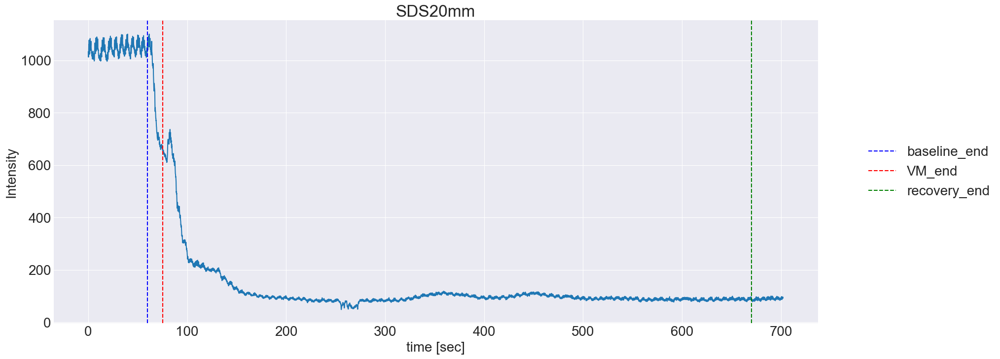

In [31]:
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(20,8))
time = [i*time_resolution for i in range(raw_data.shape[0])]
plt.plot(time, raw_data.mean(1))
plt.axvline(x=baseline_end, linestyle='--', color='b', label='baseline_end')
plt.axvline(x=exp_end, linestyle='--', color='r', label=f'{exp}_end')
plt.axvline(recovery_end, linestyle='--', color='g', label='recovery_end')
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
          fancybox=True, shadow=True)
plt.xlabel("time [sec]")
plt.ylabel("Intensity")
plt.title('SDS20mm')
plt.savefig(os.path.join('pic', mother_folder_name, 'time', 'raw_all_time_SDS20.png'), dpi=300, format='png', bbox_inches='tight')
plt.show()

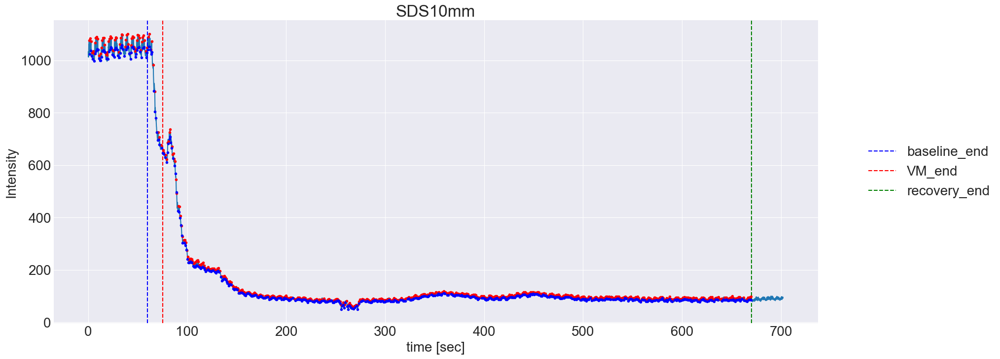

In [30]:

max_id = np.where(save_result['peak']==1)[0]
min_id = np.where(save_result['peak']==-1)[0]

max_id = max_id[np.where(max_id<round(recovery_end/time_resolution))[0]]
min_id = min_id[np.where(min_id<round(recovery_end/time_resolution))[0]]

plt.figure(figsize=(20,8))
time = save_result['time(s)']
plt.plot(time, data_EMD.mean(1))
plt.axvline(x=baseline_end, linestyle='--', color='b', label='baseline_end')
plt.axvline(x=exp_end, linestyle='--', color='r', label=f'{exp}_end')
plt.axvline(recovery_end, linestyle='--', color='g', label='recovery_end')
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
          fancybox=True, shadow=True)
plt.plot(time[max_id], data_EMD.mean(1)[max_id], 'r.')
plt.plot(time[min_id], data_EMD.mean(1)[min_id], 'b.')
plt.xlabel("time [sec]")
plt.ylabel("Intensity")
plt.title('SDS10mm')
plt.savefig(os.path.join('pic', mother_folder_name, 'time', 'processed_all_time_SDS10.png'), dpi=300, format='png', bbox_inches='tight')
plt.show()

In [32]:
plt.rcParams.update({'font.size': 12})
Processer.long_plot_all_fig(data=raw_data, 
            wavelength=total_wl,
            name='raw')

Processer.long_plot_all_fig(data=data_no_spike, 
            wavelength=total_wl,
            name='remove_spike_and_bg')
    
Processer.long_plot_all_fig(data=data_EMD, 
            wavelength=total_wl,
            name='EMD')

Processer.plot_Rmax_Rmin(data=data_EMD,
                         wavelength=total_wl,
                         max_idx_Set=max_idx,
                         min_idx_Set=min_idx,
                         name="get_peak",
                         start_time=0,
                         end_time=recovery_end)

for using_num_IMF in [1,2,3]:
    Processer.plot_time_EMD(data=data_no_spike,
                    name='EMD',
                    start_time=0,
                    end_time=recovery_end,
                    using_num_IMF=using_num_IMF)

    Processer.plot_compare_time_EMD(data=data_no_spike,
                        name='compare',
                        start_time=0,
                        end_time=recovery_end,
                        using_num_IMF=using_num_IMF)

    
    for ts in range(0,recovery_end,time_interval):
        td = ts + time_interval
        Processer.plot_time_EMD(data=data_no_spike,
                    name='EMD',
                    start_time=ts,
                    end_time=td,
                    using_num_IMF=using_num_IMF)

        Processer.plot_compare_time_EMD(data=data_no_spike,
                            name='compare',
                            start_time=ts,
                            end_time=td,
                            using_num_IMF=using_num_IMF)

d:\ijv_code_new\IJV-Project\in_vivo_experiments\utils.py:460: RuntimeWarning: Mean of empty slice.
  R_max_spec = data[max_idx_subset, :].mean(0)
d:\ijv_code_new\venv\lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
d:\ijv_code_new\IJV-Project\in_vivo_experiments\utils.py:461: RuntimeWarning: Mean of empty slice.
  R_min_spec = data[min_idx_subset, :].mean(0)


## Phantom Calibration

### Process spectrapro+EMCCD raw phantom data

100%|██████████| 4/4 [00:07<00:00,  1.82s/it]


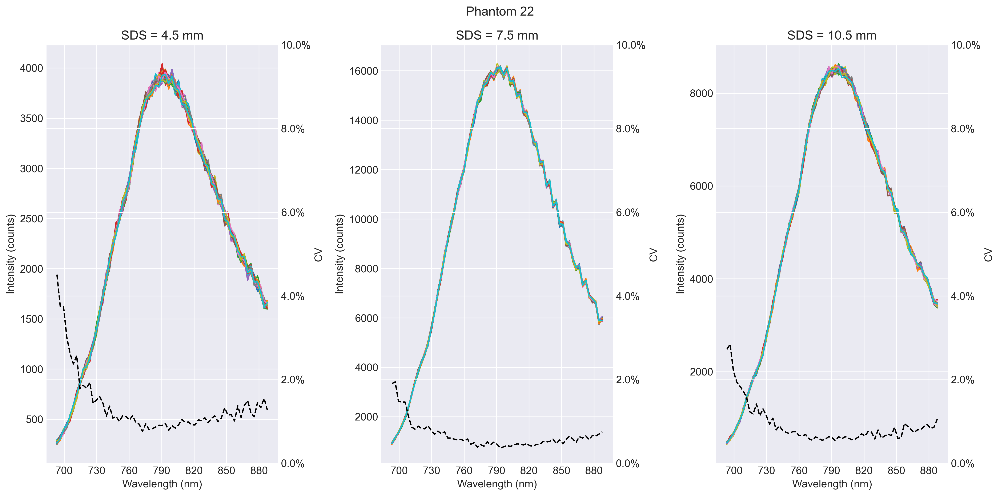

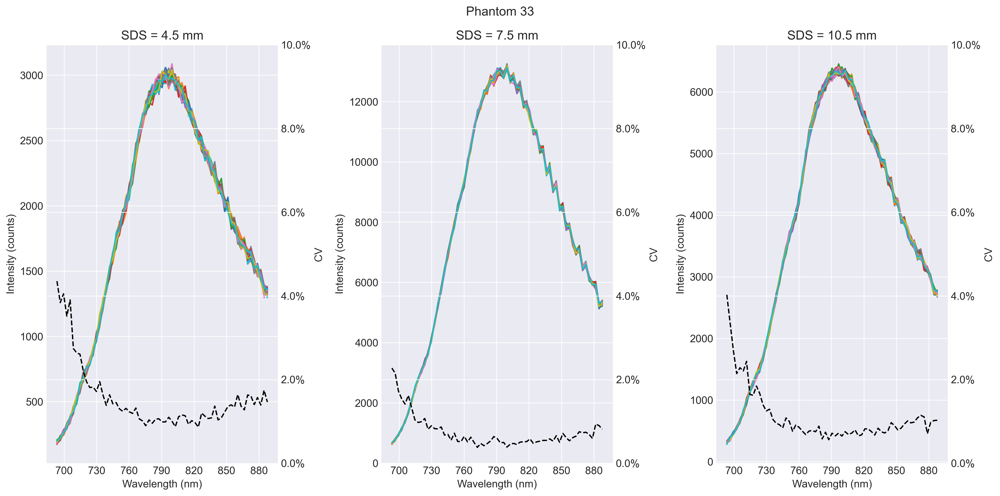

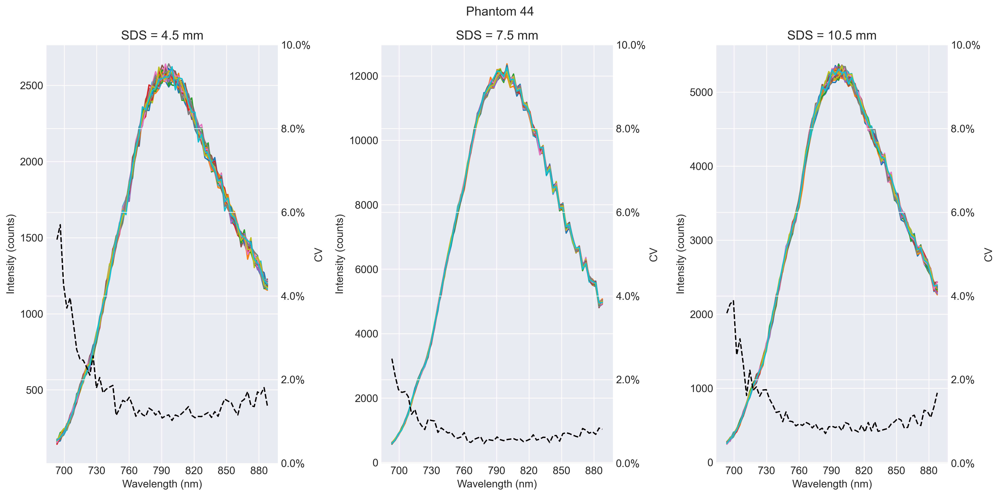

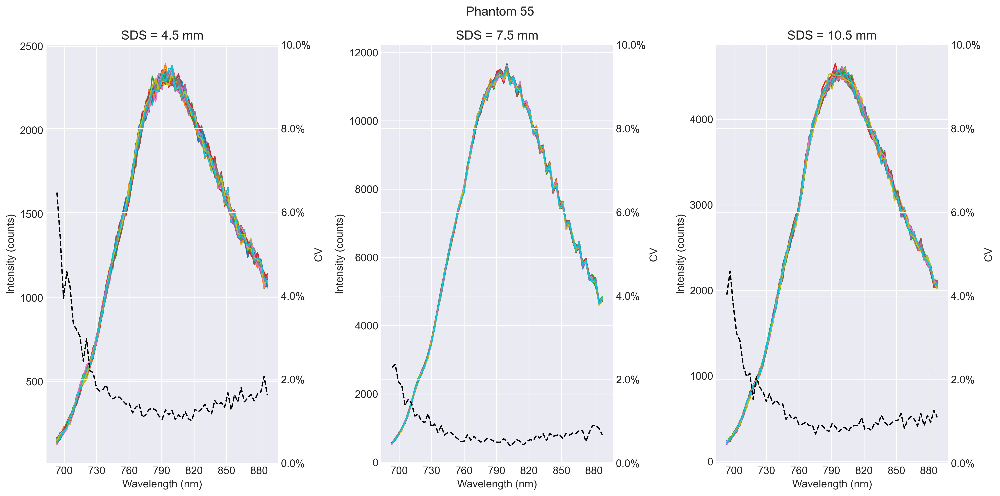

In [36]:
# %% Load target spectrum
folder_list = glob(os.path.join(ifolder, '*'))
stdname = 'standard0.1'
if any(stdname in folder_list[i] for i in range(len(folder_list))):
    path_det_bg = glob(os.path.join(ifolder, stdname, 'background*'))
    path_det_bg = natsorted(path_det_bg)
    
    path_det = glob(os.path.join(ifolder, stdname, 'std*')) 
    path_det = natsorted(path_det)
    
    bg_arr, df_det_mean, df_det_ch1, df_det_ch2, df_det_ch3 = process_raw_data.get_spec(path_det_bg, path_det, row_choose, a, b, img_size=(20, 320))
    df_det_mean.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_mean.csv'), index = False)
    df_det_ch1.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch1.csv'), index = False)
    df_det_ch2.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch2.csv'), index = False)
    df_det_ch3.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, stdname+'_det_ch3.csv'), index = False)
    
for tar_name in tqdm(phantom_measured_ID):
    path_det_bg = glob(os.path.join(ifolder, tar_name, 'background*'))
    path_det_bg = natsorted(path_det_bg)
    
    path_det = glob(os.path.join(ifolder, tar_name, tar_name + '*')) 
    path_det = natsorted(path_det)
    
    bg_arr, df_det_mean, df_det_ch1, df_det_ch2, df_det_ch3 = process_raw_data.get_spec(path_det_bg, path_det, row_choose, a, b, img_size=(20, 320))
    df_det_mean.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_mean.csv'), index = False)
    df_det_ch1.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch1.csv'), index = False)
    df_det_ch2.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch2.csv'), index = False)
    df_det_ch3.loc[start_wl:stop_wl, :].to_csv(os.path.join(ofolder, tar_name+'_det_ch3.csv'), index = False)
    det_list = [df_det_ch1, df_det_ch2, df_det_ch3]
    stat_list = process_raw_data.get_stat(det_list, start_wl, stop_wl)
    fig, ax = plt.subplots(1, 3, figsize=(16, 8), dpi=300)
    for i in range(3):
        for j in range(df_det_ch1.shape[1]-1):
            ax[i].plot(det_list[i].loc[start_wl:stop_wl, 'wl'], det_list[i].loc[start_wl:stop_wl, f'shot_{j}'])
        ax[i].set_title(f'SDS = {SDS_LIST[i]} mm')
        ax[i].set_xticks(np.arange(700, 881, 30))
        ax[i].set_xlabel('Wavelength (nm)')
        ax[i].set_ylabel('Intensity (counts)')
        ax2 = ax[i].twinx()
        ax2.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1f%%'))
        ax2.plot(stat_list[i]['wl'], 100 * stat_list[i]['cv'], color='black', linestyle='--')
        ax2.set_ylabel('CV')
        ax2.set_yticks(np.linspace(0, 10, 6))
        ax2.tick_params(axis='y')
        
    fig.suptitle(f'Phantom {tar_name}')
    fig.tight_layout()
    fig.savefig(os.path.join(ofolder, f'{tar_name}.png'))

## Sync spectraprofile to QEpro file

In [37]:
for phantom_ID in phantom_measured_ID:
    data = pd.read_csv(os.path.join(ofolder, f'{phantom_ID}_det_ch3.csv'))
    total_wl =  data['wl'].to_numpy(dtype=np.float64)
    data = data.to_numpy().T
    time = [i*time_resolution for i in range(1,data.shape[0])]
    df = {'Wavelength (nm)': time}
    for idx, wl in enumerate(total_wl):
        df[wl] = data[1:,idx]
    df = pd.DataFrame(df)
    df.to_csv(os.path.join(ofolder, f'{phantom_ID}_SDS1_sync.csv'), index=False)
df

,Wavelength (nm),693.3425,696.38,699.4175,702.4549999999999,705.4925000000001,708.53,711.5675,714.605,717.6424999999999,...,860.405,863.4425,866.48,869.5175,872.5550000000001,875.5925,878.63,881.6675,884.705,887.7425000000001
0,0.10404,225.04,273.6,315.66,394.44,415.86,558.08,671.5,776.1,872.5,...,2733.9,2653.7,2626.4,2502.22,2552.84,2401.76,2340.26,2256.66,2073.3,2075.82
1,0.20808,234.04,267.6,299.66,396.44,433.86,534.08,644.5,771.1,871.5,...,2761.9,2657.7,2574.4,2474.22,2481.84,2394.76,2342.26,2274.66,2111.3,2075.82
2,0.31212,221.04,257.6,324.66,373.44,433.86,570.08,656.5,785.1,859.5,...,2801.9,2656.7,2630.4,2517.22,2556.84,2446.76,2352.26,2205.66,2078.3,2072.82
3,0.41616,237.04,254.6,295.66,372.44,434.86,577.08,680.5,788.1,870.5,...,2761.9,2663.7,2660.4,2523.22,2491.84,2402.76,2288.26,2268.66,2067.3,2050.82
4,0.52020,200.04,270.6,305.66,350.44,463.86,550.08,664.5,809.1,862.5,...,2775.9,2748.7,2637.4,2493.22,2510.84,2422.76,2352.26,2263.66,2032.3,2109.82
5,0.62424,236.04,247.6,321.66,379.44,444.86,553.08,671.5,770.1,882.5,...,2774.9,2640.7,2645.4,2515.22,2533.84,2392.76,2374.26,2214.66,2117.3,2065.82
6,0.72828,224.04,231.6,305.66,369.44,443.86,561.08,651.5,793.1,872.5,...,2782.9,2660.7,2619.4,2485.22,2519.84,2406.76,2336.26,2261.66,2064.3,2044.82
7,0.83232,227.04,266.6,321.66,375.44,447.86,549.08,659.5,778.1,872.5,...,2771.9,2625.7,2634.4,2467.22,2540.84,2423.76,2381.26,2259.66,2129.3,2080.82
8,0.93636,223.04,263.6,338.66,387.44,435.86,548.08,646.5,760.1,893.5,...,2783.9,2664.7,2580.4,2515.22,2521.84,2402.76,2374.26,2260.66,2126.3,2052.82
9,1.04040,223.04,266.6,295.66,365.44,448.86,562.08,647.5,748.1,884.5,...,2768.9,2708.7,2616.4,2516.22,2505.84,2410.76,2335.26,2259.66,2117.3,2068.82


### Load measured phantom data

In [ ]:
# get measured phantom data
phantom_data = {} # CHIK3456
for ID in phantom_measured_ID:
    # define plot savepath
    os.makedirs(os.path.join("pic", mother_folder_name, 'phantom', ID), exist_ok=True)
    
    # import measured data
    data, total_wl = process_raw_data.read_file(os.path.join(ofolder, f'{ID}_SDS1_sync.csv'))
    
    # remove spike
    remove_spike_data = process_phantom.remove_spike(total_wl, data, 
                                                     normalStdTimes=2, 
                                                     savepath=os.path.join("pic", mother_folder_name,'phantom', ID)) # remove spike
    time_mean_data = remove_spike_data.mean(0) # mean of measured signal
    
    # plt.plot(data.mean(1))
    # plt.plot(remove_spike_data.mean(1), 'o--')
    # plt.show()
    phantom_data[ID] = time_mean_data

### Load simulated phantom data

In [39]:
# load used wavelength
with open(os.path.join("OPs_used", "wavelength.json"), "r") as f:
    wavelength = json.load(f)
    wavelength = wavelength['wavelength']


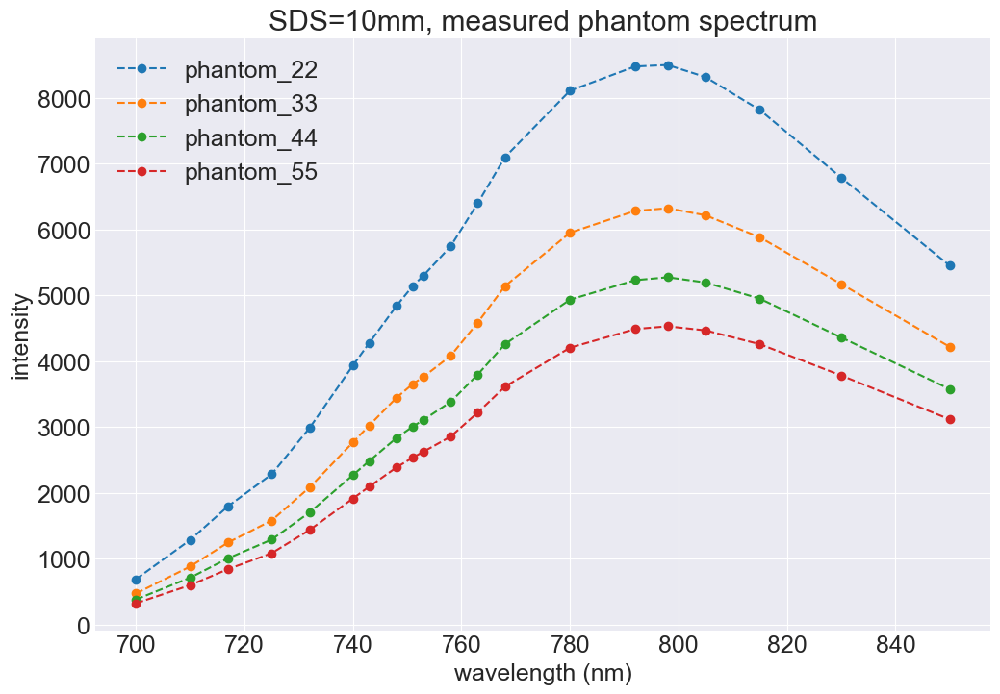

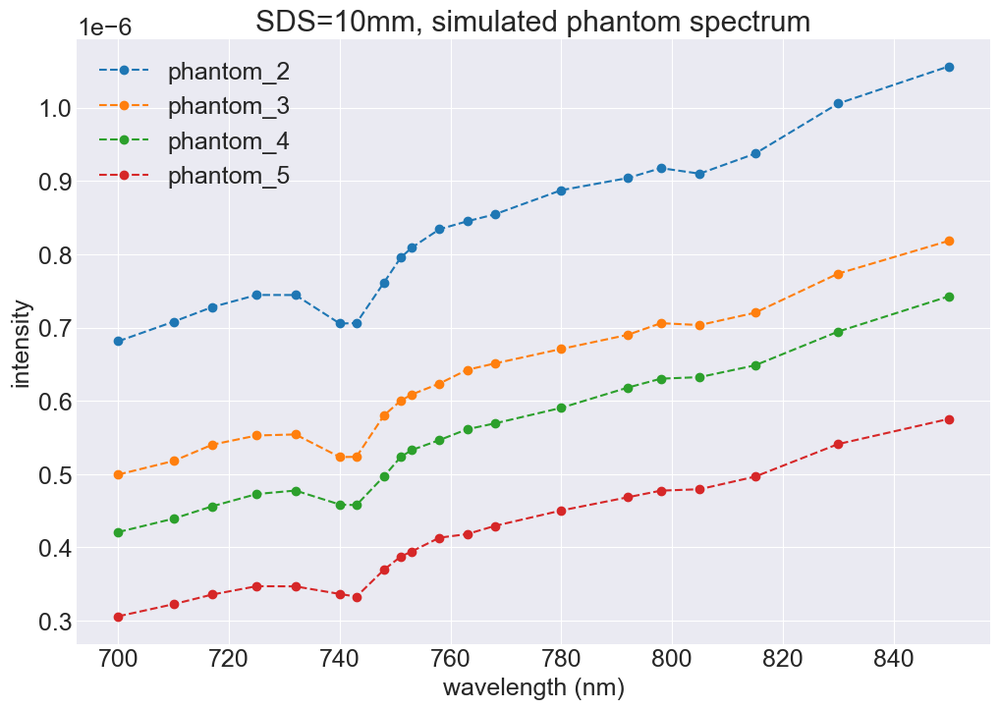

In [40]:
matplotlib.rcParams.update({'font.size': 18})
## Get the same simulated wavelength point from measured phantom
measured_phantom_data = []
plt.figure(figsize=(12,8))
# Cubic spline interpolation"
for idx, out_k in enumerate(phantom_data.keys()):
    data = phantom_data[out_k]
    f_interpolate = interp1d(total_wl, data, kind='linear', bounds_error=False, fill_value='extrapolate')
    used_wl_data = f_interpolate(wavelength)
    measured_phantom_data.append(used_wl_data)
    plt.plot(wavelength, used_wl_data, 'o--', label=f'phantom_{phantom_measured_ID[idx]}')
plt.title("SDS=10mm, measured phantom spectrum")
plt.xlabel('wavelength (nm)')
plt.ylabel('intensity')
plt.legend()
plt.savefig(os.path.join("pic", mother_folder_name, 'phantom', "measured_phantom_adjust_wl.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()
measured_phantom_data = np.array(measured_phantom_data)

## Get simulated phantom data
sim_phantom_data = []
plt.figure(figsize=(12,8))
for c in phantom_simulated_ID:
    data = np.load(os.path.join("dataset", "phantom_simulated", f'{c}.npy'))
    sim_phantom_data.append(data[:,SDS_idx].tolist())
    plt.plot(wavelength, data[:,SDS_idx], 'o--',label=f'phantom_{c}')
plt.title("SDS=10mm, simulated phantom spectrum")
plt.xlabel('wavelength (nm)')
plt.ylabel('intensity')
plt.legend()
plt.savefig(os.path.join("pic", mother_folder_name, 'phantom', "simulated_phantom_adjust_wl.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()
sim_phantom_data = np.array(sim_phantom_data)

### Fit measured phantom and simulated phantom

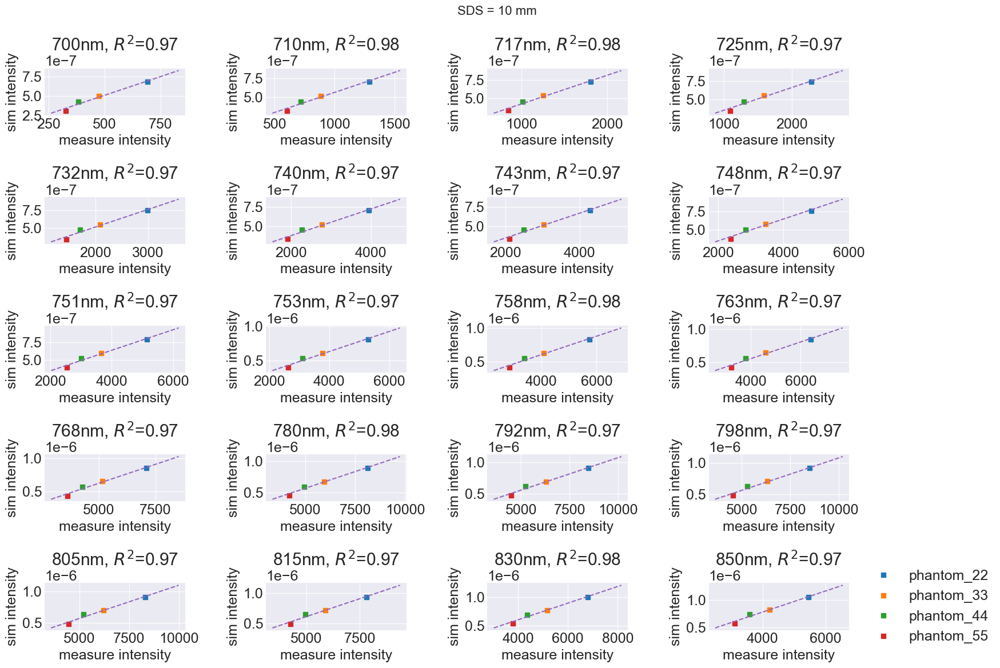

In [41]:
fig = plt.figure(figsize=(18,12))
fig.suptitle(f"SDS = {using_SDS} mm", fontsize=16)
count = 1
for idx, used_wl in enumerate(wavelength):
    ## fit measured phantom and simulated phantom
    z = np.polyfit(measured_phantom_data[:, idx], sim_phantom_data[:,idx], 1)
    plotx = np.linspace(measured_phantom_data[-1, idx]*0.8,  measured_phantom_data[0, idx]*1.2,100)
    ploty = plotx*z[0] + z[1]
    calibrate_data = measured_phantom_data[:, idx]*z[0] + z[1]
    R_square = process_phantom.cal_R_square(calibrate_data, sim_phantom_data[:,idx]) # cal R square
    
    ## plot result
    ax = plt.subplot(5,4, count)
    ax.set_title(f"@wavelength={used_wl} nm")
    ax.set_title(f'{used_wl}nm, $R^{2}$={R_square:.2f}')
    for ID_idx, ID in enumerate(phantom_measured_ID):
        ax.plot(measured_phantom_data[ID_idx, idx], sim_phantom_data[ID_idx,idx], 's', label=f'phantom_{ID}')
    ax.plot(plotx, ploty, '--')
    ax.set_xlabel("measure intensity")
    ax.set_ylabel("sim intensity")
    count += 1
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
                    fancybox=True, shadow=True)
plt.tight_layout()
plt.savefig(os.path.join('pic', mother_folder_name, 'phantom', "all.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()

### Save fitting result as csv

In [42]:
result = {}
for idx, used_wl in enumerate(wavelength):
    z = np.polyfit(measured_phantom_data[:, idx], sim_phantom_data[:,idx], 1)
    result[used_wl] = z
result = pd.DataFrame(result)
os.makedirs(os.path.join("dataset",  subject_name, 'calibration_result', date) , exist_ok=True)
result.to_csv(os.path.join("dataset",  subject_name, 'calibration_result', date, "calibrate_SDS_1.csv"), index=False)

### Plot all measured phantom together

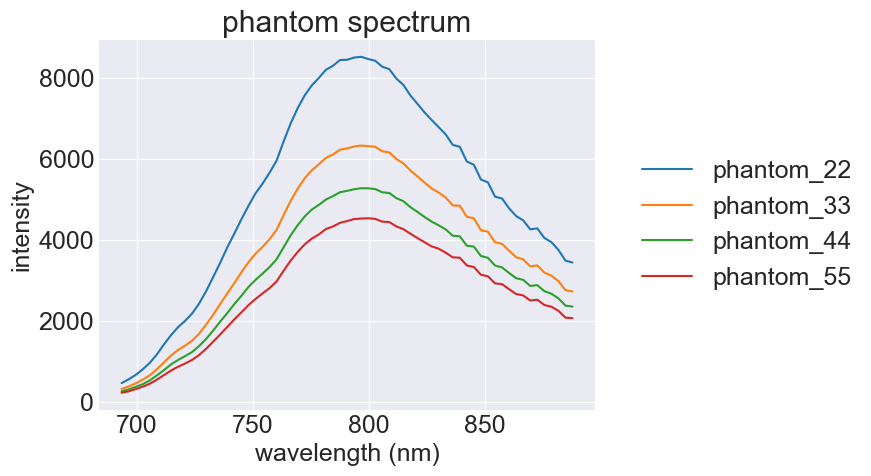

In [43]:
for idx, k in enumerate(phantom_data.keys()):
    data = phantom_data[k]
    plt.plot(total_wl, data, label=f'phantom_{phantom_measured_ID[idx]}')
plt.title('phantom spectrum')
plt.xlabel('wavelength (nm)')
plt.ylabel('intensity')
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
                fancybox=True, shadow=True)
plt.savefig(os.path.join("pic", mother_folder_name, 'phantom', "measured_2345_phantom_result.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()